# Examples of 3D Magnets

Below are examples showcasing the plotting capabilities of the library for 3D magnets.

In [1]:
if "google.colab" in str(get_ipython()):
    print("Running on CoLab. Installing package from pypi")
    %pip install pymagnet -q
else:
    print("Not running on CoLab.")

Not running on CoLab.


In [2]:
%matplotlib inline
# %matplotlib notebook
%config InlineBackend.figure_format = 'retina'
import numpy as np

import pymagnet as pm

Below are some convenience functions for generating different arrangements of magnets.
alpha, beta, gamma are the rotation angles about the z, y, and x axes.

## Prism sphere and cylinder

An assembly of a prism, sphere and cylinder magnets

In [3]:
def gen_magnets(alpha, beta, gamma, **kwargs):
    pm.reset()

    width = 10
    depth = 50
    height = 10
    hGap = kwargs.pop("hGap", 1)
    mask_magnet = kwargs.pop("mask_magnet", True)

    # magnetised in x:
    theta, phi = 0.0, 90.0

    center = (-width / 2 - 5 * hGap, 0, 0)

    m1 = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=1.0,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (10, -5, 0)
    sphere1 = pm.magnets.Sphere(
        radius=width,
        Jr=1.0,
        center=center,
        theta=0,
        phi=0,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (20, 15, 0)
    R = 5
    L = 20

    m_cyl = pm.magnets.Cylinder(
        radius=R,
        length=L,
        Jr=1.0,
        center=center,
        theta=0,
        phi=0,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

## Sphere

A single spherical magnet

In [4]:
def gen_sphere(alpha, beta, gamma, **kwargs):
    pm.reset()

    radius = 10
    center = (0, 0, 0)
    mask_magnet = kwargs.pop("mask_magnet", True)

    sphere1 = pm.magnets.Sphere(
        radius=radius,
        Jr=1.0,
        center=center,
        theta=0,
        phi=0,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

## Cylinder

A single cylindrical magnet

In [5]:
def gen_cylinder(alpha, beta, gamma, **kwargs):
    pm.reset()

    center = (0, 0, 0)
    radius = 5
    L = 20
    mask_magnet = kwargs.pop("mask_magnet", True)

    m_cyl = pm.magnets.Cylinder(
        radius=radius,
        length=L,
        Jr=1.0,
        center=center,
        theta=0,
        phi=0,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

## Classic Quadrupolar Array

Uniform magnetic field gradient, zero at the centre, and maximum at the edges

In [6]:
def gen_quad(alpha, beta, gamma, **kwargs):
    pm.reset()

    width = 10
    depth = 50
    height = 10
    hGap = kwargs.pop("hGap", 5)
    mask_magnet = kwargs.pop("mask_magnet", True)

    # magnetised in x:
    theta, phi = 0.0, 90.0

    center = (-width / 2 - hGap, 0, height / 2)

    m1 = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=1.0,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (width / 2 + hGap, 0, height / 2)
    m2 = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=1.0,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (-width / 2 - hGap, 0, -height / 2)
    m3 = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=-1.0,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (width / 2 + hGap, 0, -height / 2)
    m4 = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=-1.0,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

## Prism

A single prism/cuboid magnet

In [7]:
def gen_prism(alpha, beta, gamma, **kwargs):
    pm.reset()

    width = 10
    depth = 20
    height = 30
    center = (0, 0, 0)

    mask_magnet = kwargs.pop("mask_magnet", True)

    # magnetised in z:
    theta, phi = 90.0, 0.0

    m1 = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=1.0,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

## 8-Element Pseudo-Halbach 

This generates a uniform field of order 1.2 T

In [8]:
def gen_pseudo_halbach(alpha, beta, gamma, **kwargs):
    pm.reset()

    width = 30
    depth = width * 2
    height = width
    wall = 0
    theta, phi = 0.0, 0.0
    Jr = 1.26

    mask_magnet = kwargs.pop("mask_magnet", True)

    center = (0, 0, height + wall)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=Jr,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )
    center = (width + wall, 0, 0)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=-Jr,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )
    center = (0, 0, -height - wall)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=Jr,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )
    center = (-width - wall, 0, 0)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=-Jr,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (height + wall, 0, height + wall)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=Jr,
        center=center,
        theta=theta,
        phi=90,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )
    center = (height + wall, 0, -height - wall)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=-Jr,
        center=center,
        theta=theta,
        phi=90,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )
    center = (-height - wall, 0, height + wall)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=-Jr,
        center=center,
        theta=theta,
        phi=90,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    center = (-height - wall, 0, -height - wall)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=Jr,
        center=center,
        theta=theta,
        phi=90,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

## 5-Element Assembly for vertical fields

In [9]:
def gen_perp_field(alpha, beta, gamma, all_mag=True, **kwargs):
    pm.reset_magnets()

    width = 10
    depth = width * 1
    height = width * 1
    wall = 0.1
    z_offset = 0.2
    theta, phi = 0.0, 0.0
    Jr = 1.26

    mask_magnet = kwargs.pop("mask_magnet", True)

    center = (0, 0, -height / 2 - z_offset)
    _ = pm.magnets.Prism(
        width=width,
        depth=depth,
        height=height,
        Jr=Jr,
        center=center,
        theta=theta,
        phi=phi,
        alpha=alpha,
        beta=beta,
        gamma=gamma,
        mask_magnet=mask_magnet,
    )

    if all_mag:
        center = (-width - wall, 0, -height / 2 - z_offset)
        theta, phi = 0.0, 90.0
        _ = pm.magnets.Prism(
            width=width,
            depth=depth,
            height=height,
            Jr=Jr,
            center=center,
            theta=theta,
            phi=phi,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            mask_magnet=mask_magnet,
        )

        center = (width + wall, 0, -height / 2 - z_offset)
        theta, phi = 0.0, 90.0
        _ = pm.magnets.Prism(
            width=width,
            depth=depth,
            height=height,
            Jr=-Jr,
            center=center,
            theta=theta,
            phi=phi,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            mask_magnet=mask_magnet,
        )

        center = (0, -depth - wall, -height / 2 - z_offset)
        theta, phi = 90.0, 90.0
        _ = pm.magnets.Prism(
            width=width,
            depth=depth,
            height=height,
            Jr=Jr,
            center=center,
            theta=theta,
            phi=phi,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            mask_magnet=mask_magnet,
        )

        center = (0, depth + wall, -height / 2 - z_offset)
        theta, phi = 90.0, 90.0
        _ = pm.magnets.Prism(
            width=width,
            depth=depth,
            height=height,
            Jr=-Jr,
            center=center,
            theta=theta,
            phi=phi,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            mask_magnet=mask_magnet,
        )

## Cylinder Arrays

This is an implementation of the arrays used in these papers:

P. Dunne and J. M. D. Coey, Patterning Metallic Electrodeposits with Magnet Arrays, Physical Review B 85, 224411 (2012).

P. Dunne, L. Mazza, and J. M. D. Coey, Magnetic Structuring of Electrodeposits, Phys. Rev. Lett. 107, 024501 (2011).

In [10]:
def gen_cylinder_array(alpha, beta, gamma, alternate=False, **kwargs):
    pm.reset()

    radius = 5
    L = 20
    step = 3 * radius
    Num_mag = kwargs.pop("Num_mag", 2)
    NnumJ = (Num_mag + 1) * 1j
    (
        XX,
        YY,
    ) = np.mgrid[
        -Num_mag * step : Num_mag * step + step : step,
        -Num_mag * step : Num_mag * step + step : step,
    ]

    mask_magnet = kwargs.pop("mask_magnet", True)

    for i, (xc, yc) in enumerate(zip(XX.ravel(), YY.ravel(), strict=False)):
        center = (xc, yc, -L / 2 - 0.5)
        if alternate:
            odd_coef = np.real(1j ** (2 * i))
        else:
            odd_coef = 1

        _ = pm.magnets.Cylinder(
            radius=radius,
            length=L,
            Jr=1.26 * odd_coef,
            center=center,
            theta=0,
            phi=0,
            alpha=alpha,
            beta=beta,
            gamma=gamma,
            mask_magnet=mask_magnet,
        )

Uncomment one of the `gen_xxx` functions to generate the required magnets and visualise it

In [23]:
mask_magnet = False  # mask values inside a magnet as NaN if True
show_magnets = True  # draw magnet in plots


# gen_magnets(alpha=20.0, beta=30.0, gamma=60.0, mask_magnet = mask_magnet)
# gen_quad(alpha=0.0, beta=0.0, gamma=0.0, mask_magnet = mask_magnet)
# gen_prism(alpha=10.0, beta=30.0, gamma=30.0, mask_magnet = mask_magnet)
# gen_sphere(alpha=30.0, beta=30.0, gamma=30.0, mask_magnet = mask_magnet)
# gen_cylinder(alpha=0.0, beta=45.0, gamma=4.0, mask_magnet = mask_magnet)

# Try alternate=False
gen_cylinder_array(
    alpha=0.0, beta=0.0, gamma=0.0, alternate=True, mask_magnet=mask_magnet
)

# gen_pseudo_halbach(alpha=0.0, beta=0.0, gamma=0.0, mask_magnet = mask_magnet)

# gen_perp_field(alpha=0.0, beta=0.0, gamma=0.0, all_mag=True, mask_magnet = mask_magnet)

fig_slice, slice_cache, data_objects = pm.plots.slice_quickplot(
    cmax=0.5,
    num_levels=11,
    opacity=1.0,
    num_arrows=10,
    num_points=200,
    cone_opacity=0.9,
    magnet_opacity=1.0,
    mask_magnet=mask_magnet,
    show_magnets=show_magnets,
    max1=30,
    max2=30,
    slice_value=0.0,
    unit="mm",
)

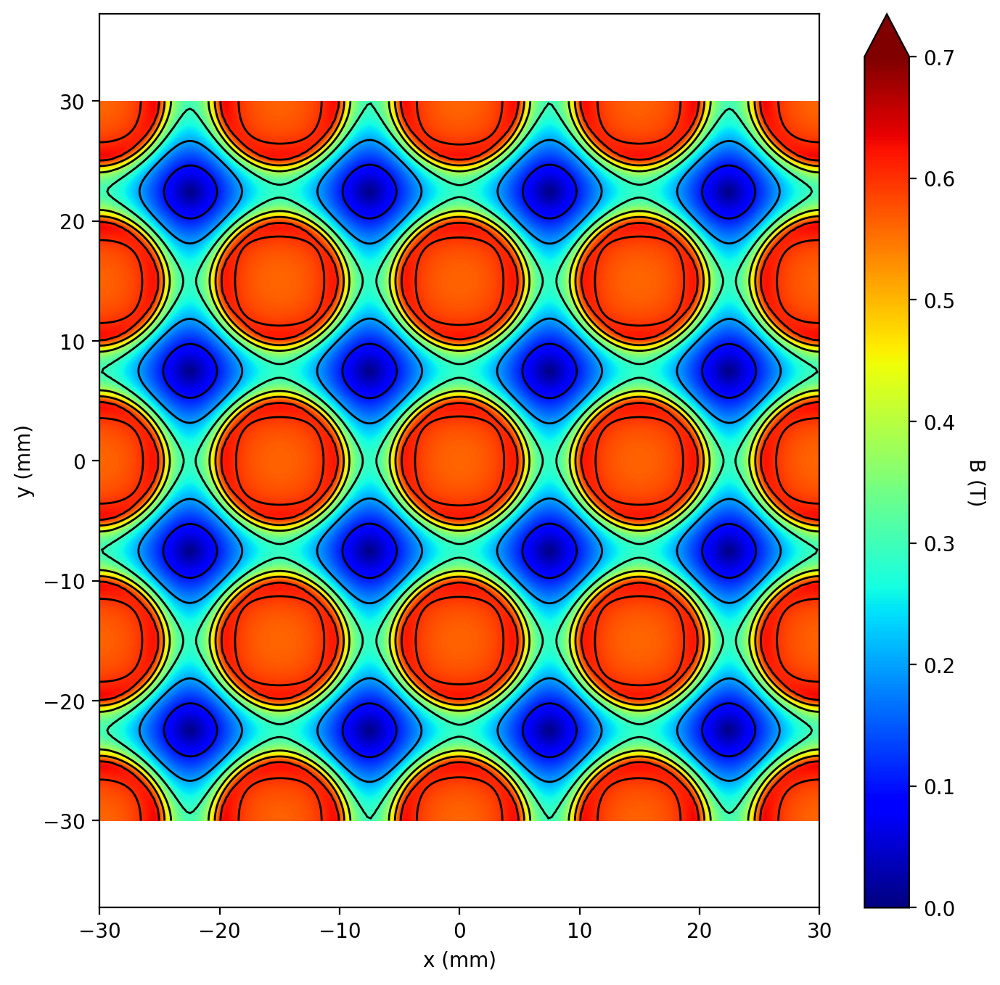

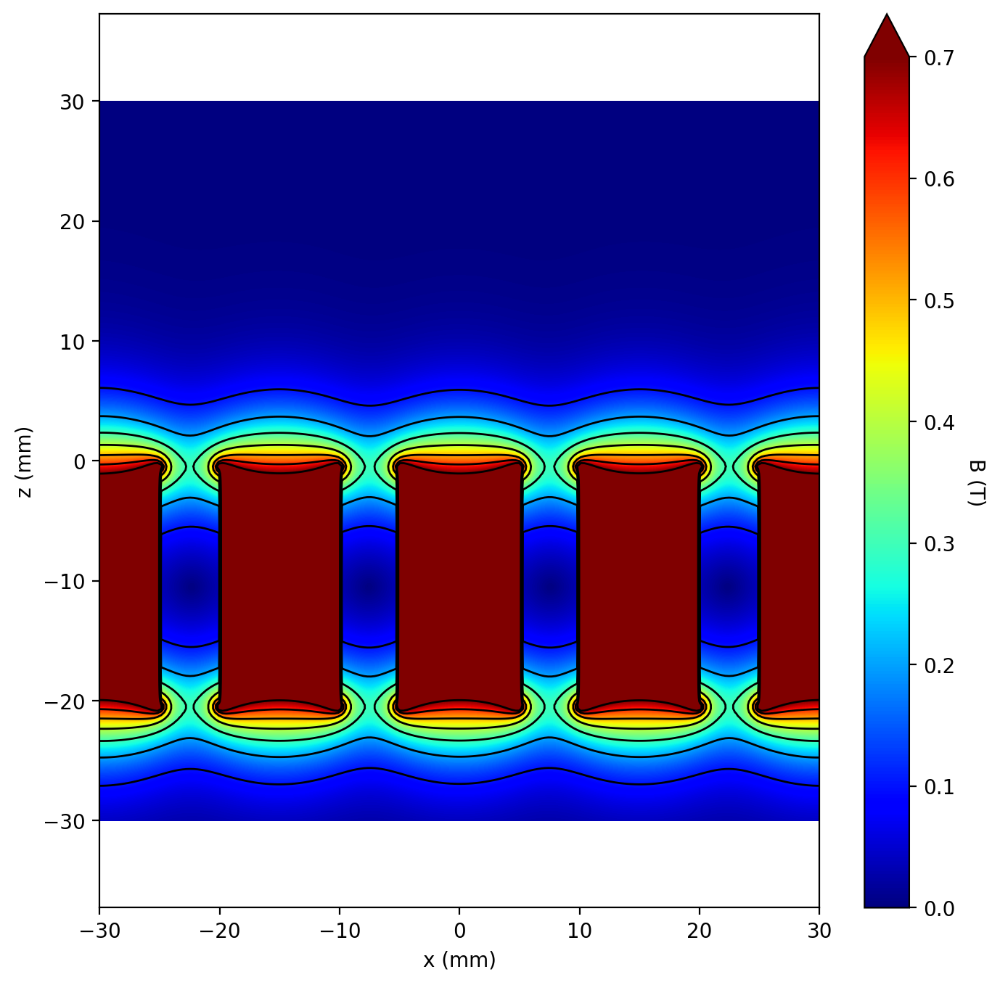

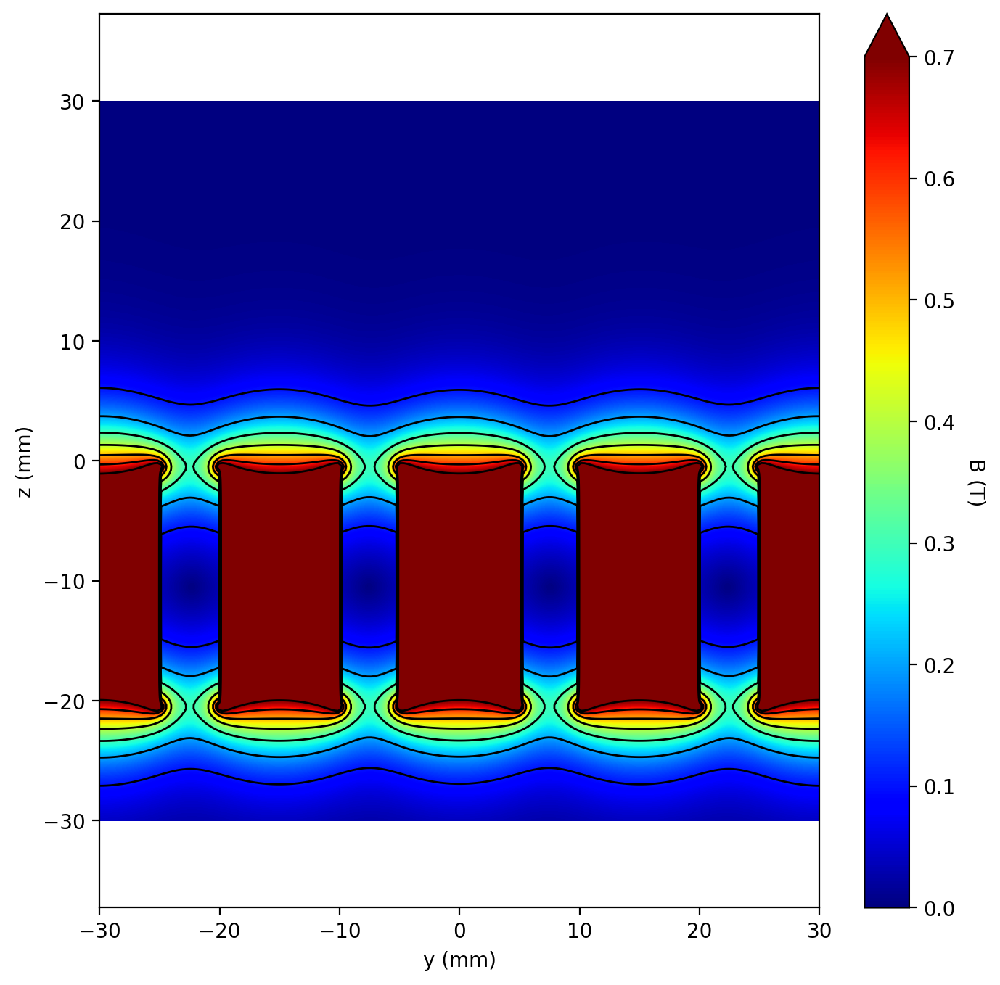

In [24]:
for plane in slice_cache.keys():
    pm.plots.plot_3D_contour(
        slice_cache[plane]["points"],
        slice_cache[plane]["field"],
        plane,
        cmin=0,
        cmax=0.7,
        num_levels=8,
        cmap="jet",
    )

In [25]:
fig_vol, vol_cache, data_objects = pm.plots.volume_quickplot(
    cmin=0.0,
    cmax=0.5,
    opacity=0.3,
    magnet_opacity=1.0,
    colorscale="viridis",
    no_caps=True,
    num_levels=6,
    num_points=50,
    show_magnets=True,
    xmax=30,
    ymax=30,
    zmax=30,
    #                                     zmin = -10,
    unit="mm",
    #                                     opacityscale = 'max',
    #                                     isomin=0.05,
    #                                     isomax=0.5,
)